# EIS DEM Inversion

In [1]:
import asdf
import astropy.table
import astropy.units as u
import eispac.core
import matplotlib.pyplot as plt
import ndcube
import numpy as np
import pathlib
import fiasco
import sunpy.map
import xrtpy.response

from astropy.coordinates import SkyCoord
from astropy.wcs.utils import wcs_to_celestial_frame
from astropy.visualization import ImageNormalize, LogStretch, quantity_support, AsymmetricPercentileInterval, AsinhStretch
from astropy.nddata import StdDevUncertainty
from sunpy.coordinates import propagate_with_solar_surface

from sunkit_dem import Model
from synthesizAR.analysis import make_slope_map, log_log_linear_fit

import sunpy
sunpy.log.setLevel('WARN')
import astropy
astropy.log.setLevel('WARN')

import sys
sys.path.append('../scripts')
from dem import HK12Model, MCMCModel, write_cube_with_xarray, read_cube_with_xarray

In [2]:
root_dir = pathlib.Path('../data')

## Contribution Functions

The first thing we need to do is, for each line we want to observe, we need to compute the corresponding contribution function for each line.

In [3]:
line_table = astropy.table.QTable.read(root_dir / 'tables' / 'selected_eis_lines.asdf')

In [4]:
line_table

Element,Z,Ion,Name,Wavelength,Number Gaussians,Included lines,Template filename
,,,,Angstrom,,,
str2,int64,int64,str15,float64,int64,str89,str28
Si,14,7,Si VII 275.368,275.368,3,"Si VII 275.368, unknown I 275.553, Si VII 275.665",si_07_275_368.3c.template.h5
Si,14,10,Si X 258.375,258.375,1,Si X 258.375,si_10_258_375.1c.template.h5
S,16,10,S X 264.233,264.233,1,S X 264.233,s__10_264_233.1c.template.h5
S,16,13,S XIII 256.686,256.686,1,S XIII 256.686,s__13_256_686.1c.template.h5
Ar,18,14,Ar XIV 194.396,194.396,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ar_14_194_396.6c.template.h5
Ca,20,14,Ca XIV 193.874,193.874,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ca_14_193_874.6c.template.h5
Ca,20,15,Ca XV 200.972,200.972,2,"Ca XV 200.972, Fe XIII 201.121",ca_15_200_972.2c.template.h5
Ca,20,16,Ca XVI 208.604,208.604,2,"Ca XVI 208.604, Fe XIII 208.679",ca_16_208_604.2c.template.h5


In [5]:
delta_log_T = 0.02
temperature = 10**np.arange(5.0, 7.3+delta_log_T, delta_log_T)*u.K
density = 1e9*u.cm**(-3)  #1e15*u.Unit('K cm-3') / temperature
selected_ions = {name: fiasco.Ion(name, temperature)
                 for name in np.unique([f'{r["Element"]} {r["Ion"]}' for r in line_table])}

In [6]:
contribution_functions = {k: v.contribution_function(density, couple_density_to_temperature=False)
                          for k,v in selected_ions.items()}

In [7]:
wave_neighborhood = 0.04 * u.AA
goft = []
wavelengths_chianti = []
for row in line_table:
    key = f'{row["Element"]} {row["Ion"]}'
    _ion = selected_ions[key]
    _transitions =  _ion.transitions.wavelength[~_ion.transitions.is_twophoton]
    # Look in neighborhood of EIS wavelength
    idx = np.where(np.logical_and(_transitions>=row['Wavelength']-wave_neighborhood/2,
                                  _transitions<=row['Wavelength']+wave_neighborhood/2))
    # Find contribution function with largest max value
    _g = contribution_functions[key].squeeze()[:,idx[0]]
    _waves = _transitions[idx]
    idx_g_max = np.argmax(_g.max(axis=0))
    goft.append(_g[:,idx_g_max]/(4*np.pi*u.steradian))
    wavelengths_chianti.append(_waves[idx_g_max])
line_table['Contribution Function'] = u.Quantity(goft)
line_table['Temperature Contribution Function'] = u.Quantity(len(line_table)*[temperature])
line_table.rename_column('Wavelength', 'Wavelength (EIS)')
line_table['Wavelength (CHIANTI)'] = u.Quantity(wavelengths_chianti)

In [31]:
line_table['Include in DEM Analysis'] = True
# Dropping these lines
dropped_lines = [
    #'ca_16_208_604.2c', # Drop because its too noisy
    'ca_17_192_858.1c',  # Drop because this is line is blended heavily with Fe XI and O V
]
col = line_table['Include in DEM Analysis']
for d in dropped_lines:
    col[line_table['Template filename'] == f'{d}.template.h5'] = False
line_table['Include in DEM Analysis'] = col

In [32]:
line_table

Element,Z,Ion,Name,Wavelength (EIS),Number Gaussians,Included lines,Template filename,Contribution Function,Temperature Contribution Function,Wavelength (CHIANTI),Include in DEM Analysis
,,,,Angstrom,,,,cm3 erg / (s sr),K,Angstrom,
str2,int64,int64,str15,float64,int64,str89,str28,float64[116],float64[116],float64,bool
Si,14,7,Si VII 275.368,275.368,3,"Si VII 275.368, unknown I 275.553, Si VII 275.665",si_07_275_368.3c.template.h5,1.0036737427620257e-40 .. 6.766938457690997e-42,100000.0 .. 19952623.149686545,275.3612,True
Si,14,10,Si X 258.375,258.375,1,Si X 258.375,si_10_258_375.1c.template.h5,0.0 .. 6.659685839864515e-33,100000.0 .. 19952623.149686545,258.374,True
S,16,10,S X 264.233,264.233,1,S X 264.233,s__10_264_233.1c.template.h5,0.0 .. 2.049313534516955e-36,100000.0 .. 19952623.149686545,264.2306,True
S,16,13,S XIII 256.686,256.686,1,S XIII 256.686,s__13_256_686.1c.template.h5,0.0 .. 3.093597403803537e-29,100000.0 .. 19952623.149686545,256.6852,True
Ar,18,14,Ar XIV 194.396,194.396,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ar_14_194_396.6c.template.h5,0.0 .. 2.740626670206385e-31,100000.0 .. 19952623.149686545,194.401,True
Ca,20,14,Ca XIV 193.874,193.874,6,"Fe X 193.715, Ca XIV 193.874, Ni XVI 194.046, Ar XI 194.104, Mn X 194.327, Ar XIV 194.396",ca_14_193_874.6c.template.h5,0.0 .. 9.047934471035247e-33,100000.0 .. 19952623.149686545,193.8661,True
Ca,20,15,Ca XV 200.972,200.972,2,"Ca XV 200.972, Fe XIII 201.121",ca_15_200_972.2c.template.h5,0.0 .. 3.001041324987185e-31,100000.0 .. 19952623.149686545,200.9719,True
Ca,20,16,Ca XVI 208.604,208.604,2,"Ca XVI 208.604, Fe XIII 208.679",ca_16_208_604.2c.template.h5,0.0 .. 7.21367449473259e-30,100000.0 .. 19952623.149686545,208.585,True


In [33]:
line_table.write(root_dir / 'tables' / 'selected_eis_lines_goft.asdf')

Can skip everything above this

In [3]:
line_table = astropy.table.QTable.read(root_dir / 'tables' / 'selected_eis_lines_goft.asdf')

(1e-27, 5e-24)

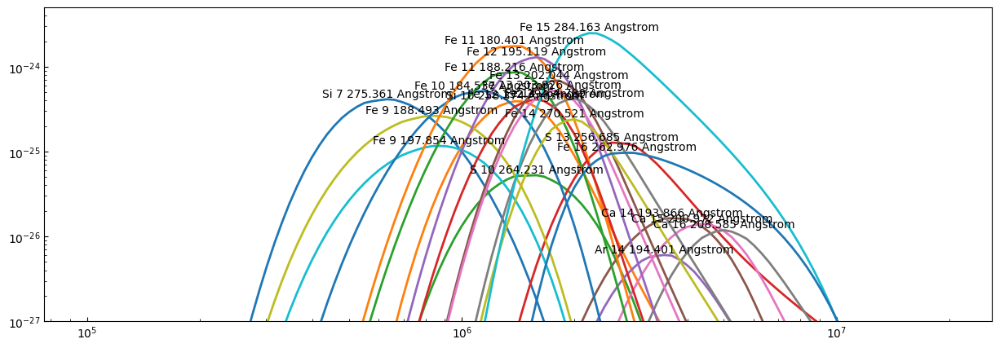

In [4]:
plt.figure(figsize=(15,5))
for r in line_table:
    if r['Include in DEM Analysis']:
        plt.plot(
            r['Temperature Contribution Function'],
            r['Contribution Function'],
        )
        imax = np.argmax(r['Contribution Function'])
        plt.text(r['Temperature Contribution Function'][imax].value,
                 r['Contribution Function'][imax].value,
                 f'{r["Element"]} {r["Ion"]} {r["Wavelength (CHIANTI)"]:.3f}',
                 va='bottom',
                 ha='center')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-27, 5e-24)
#plt.legend(ncol=5, loc=3)

Pack the contribution functions into a single dictionary

In [5]:
kernels = {'.'.join(r['Template filename'].split('.')[:-2]): r['Contribution Function'] for r in line_table}

In [6]:
ar_table = astropy.table.QTable.read(root_dir / 'tables' / 'mason_ars_region_1.asdf')

In [7]:
tf = xrtpy.response.TemperatureResponseFundamental('Be-thin', ar_table['Date mid'][2].isot)

In [8]:
kernels['be_thin'] = np.interp(line_table['Temperature Contribution Function'][0],
                               tf.CHIANTI_temperature, 
                               tf.temperature_response()) * 1.5

## Building Data Structures

In [9]:
def map_to_cube(smap, error_percentage=0.1, target_wcs=None, mask_below=0.0):
    meta = smap.meta
    unit = smap.unit
    if target_wcs:
        with propagate_with_solar_surface():
            smap = smap.reproject_to(target_wcs, algorithm='exact')
    smap.mask = (smap.data <= mask_below) | (~np.isfinite(smap.data))
    uncertainty = StdDevUncertainty(error_percentage*(smap.data*unit))
    cube = ndcube.NDCube(smap.data,
                         wcs=smap.wcs,
                         meta=meta,
                         unit=unit,
                         mask=smap.mask,
                         uncertainty=uncertainty)
    return cube


def eis_maps_to_collection(root_dir, table, target_wcs, mask_below=0.0, error_percentage=0.1):
    """
    Take a directory of EIS FITS files and a line table and build a collection of cubes
    from those maps.

    Parameters
    ----------
    root_dir
    table

    Returns
    -------
    collection
    """
    collection = []
    root_dir = pathlib.Path(root_dir)
    for row in table:
        if not row['Include in DEM Analysis']:
            continue
        line_label = '.'.join(row['Template filename'].split('.')[:-2])
        if len(filename := list(root_dir.glob(f'eis_*.{line_label}-*.int.fits'))) == 0:
            print(f'No data available for {line_label} in {root_dir}.')
            continue
        if len(filename) > 1:
            print(f'Multiple filenames found for {line_label}:\n{filename}')
        m = sunpy.map.Map(filename[0])
        cube = map_to_cube(m,
                           error_percentage=error_percentage,
                           target_wcs=target_wcs,
                           mask_below=mask_below)
        collection.append((line_label, cube))
    collection = ndcube.NDCollection(
        collection,
        aligned_axes=(0,1),#len(collection)*[(0,1)]
    )
    return collection

Build a collection of cubes for each one of the passes of the AR

In [11]:
collections = {}
for row in ar_table:
    # Directories
    top_dir = root_dir / f'noaa_{row["NOAA AR"]}'
    eis_dir = top_dir / 'EIS' / 'level_2.6'
    # Build collection
    _m_eis_ref = sunpy.map.Map(list(eis_dir.glob('eis_*.fe_12_195_119.2c-0.int.fits')))
    _collection = eis_maps_to_collection(eis_dir, line_table, _m_eis_ref.wcs, error_percentage=0.2)
    if (xrt_file := top_dir / 'XRT' / 'level_1' / row['XRT file']).is_file():
        _m_xrt = sunpy.map.Map(xrt_file)
        _m_xrt = sunpy.map.Map(np.where(_m_xrt.data<0,0,_m_xrt.data), _m_xrt.meta)
        _m_xrt.meta['bunit'] = 'DN / s'  # hack until fix in XRT source is merged
        _m_xrt = _m_xrt / (1*u.pix)
        _collection.update(
            [('be_thin', map_to_cube(_m_xrt, error_percentage=0.2, target_wcs=_m_eis_ref.wcs, mask_below=0.0))],
            (0,1)
        )
    collections[row["NOAA AR"]] = _collection

No data available for si_10_258_375.1c in ../data/noaa_11990/EIS/level_2.6.
No data available for s__10_264_233.1c in ../data/noaa_11990/EIS/level_2.6.
No data available for ar_14_194_396.6c in ../data/noaa_11990/EIS/level_2.6.
No data available for ca_14_193_874.6c in ../data/noaa_11990/EIS/level_2.6.
No data available for ca_15_200_972.2c in ../data/noaa_11990/EIS/level_2.6.
No data available for ca_16_208_604.2c in ../data/noaa_11990/EIS/level_2.6.
No data available for fe_09_197_862.1c in ../data/noaa_11990/EIS/level_2.6.
No data available for fe_11_180_401.1c in ../data/noaa_11990/EIS/level_2.6.
No data available for fe_14_264_787.1c in ../data/noaa_11990/EIS/level_2.6.
No data available for fe_14_270_519.2c in ../data/noaa_11990/EIS/level_2.6.


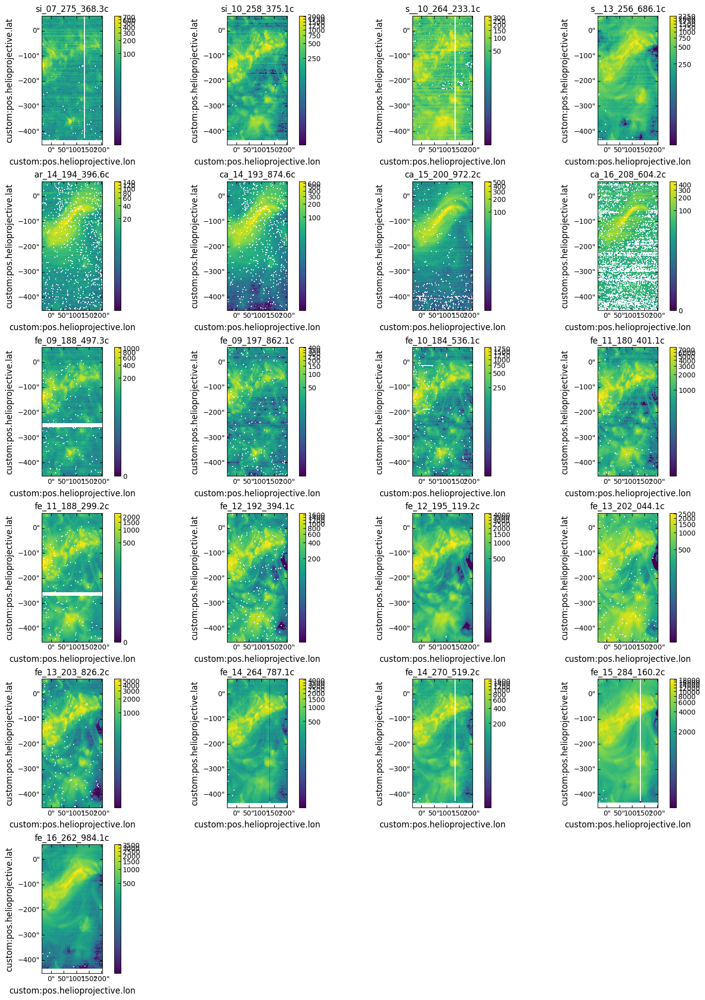

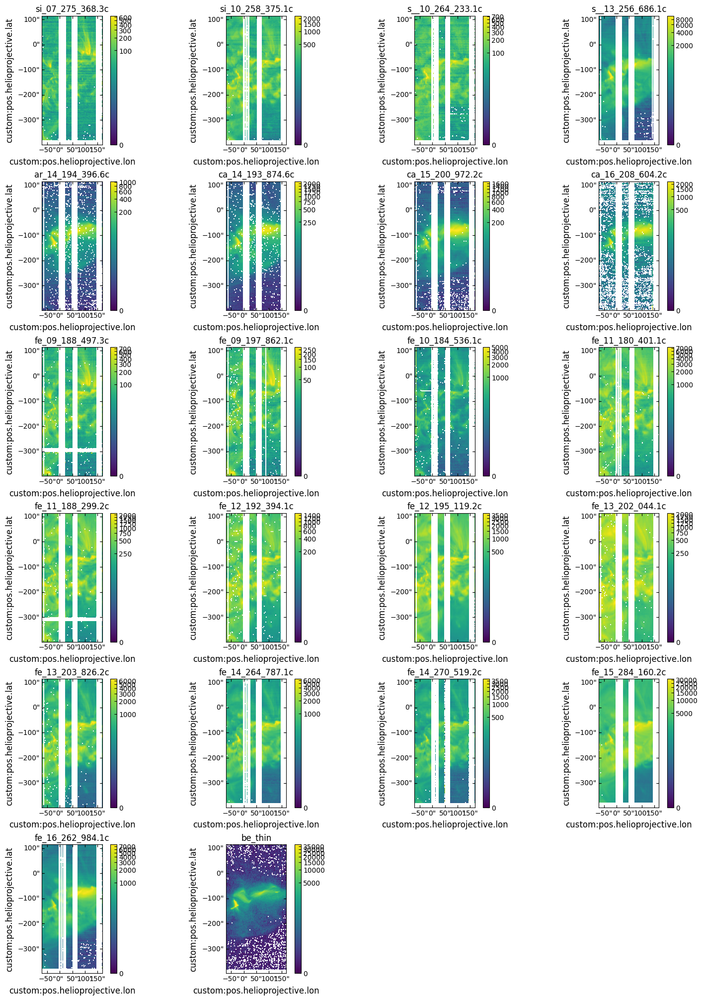

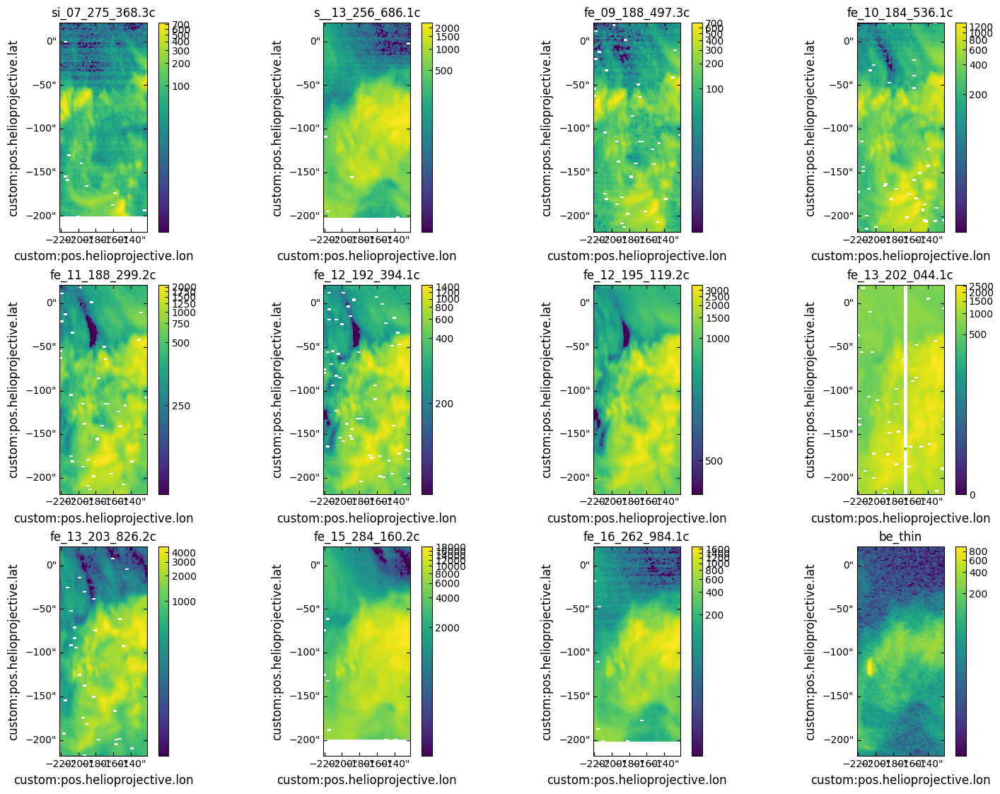

In [12]:
for ar in collections:
    fig = plt.figure(figsize=(15,20),layout='constrained')
    for i,(k,v) in enumerate(collections[ar].items()):
        ax = fig.add_subplot(6,4,i+1,projection=v.wcs)
        vmin,vmax = AsymmetricPercentileInterval(1,99.9).get_limits(v.data)
        v.plot(axes=ax, norm=ImageNormalize(vmin=vmin,vmax=vmax,stretch=LogStretch()))
        ax.set_aspect(0.5)
        ax.set_title(k)
        fig.colorbar(ax.get_images()[0], ax=ax)

## Inversion

In [49]:
dem_settings = {
    'alpha': 1.0,
    'increase_alpha': 1.1,
    'max_iterations': 100,
    'use_em_loci': True,
    'emd_int': False,
    'l_emd': False,
    'guess': 1,
}

In [50]:
delta_log_t = 0.1
temperature_bin_edges = 10**np.arange(5.0, 7.2+delta_log_t, delta_log_t) * u.K

In [51]:
for row in ar_table:
    print(row['NOAA AR'])
    # Directories
    top_dir = root_dir / f'noaa_{row["NOAA AR"]}'
    eis_dir = top_dir / 'EIS' / 'level_2.5'
    em_dir = top_dir / 'diagnostics' / 'dem'
    em_dir.mkdir(exist_ok=True, parents=True)
    # Build collection
    _m_eis_ref = sunpy.map.Map(list(eis_dir.glob('eis_*.fe_12_195_119.2c-0.int.fits')))
    _collection = eis_maps_to_collection(eis_dir, line_table, _m_eis_ref.wcs, error_percentage=0.2)
    #if (xrt_file := top_dir / 'XRT' / 'level_1' / row['XRT file']).is_file():
    #    print(f'Including XRT file for {row["NOAA AR"]}')
    #    _m_xrt = sunpy.map.Map(xrt_file)
    #    _m_xrt = sunpy.map.Map(np.where(_m_xrt.data<0,0,_m_xrt.data), _m_xrt.meta)
    #    _m_xrt.meta['bunit'] = 'DN / s'  # hack until fix in XRT source is merged
    #    _m_xrt = _m_xrt / (1*u.pix)
    #    _collection.update(
    #        [('be_thin', map_to_cube(_m_xrt, error_percentage=0.2, target_wcs=_m_eis_ref.wcs, mask_below=0.0))],
    #        (0,1)
    #    )
    # Run model
    dem_model = Model(_collection,#[245:255,50:60],
                      {k:v for k,v in kernels.items() if k in _collection},
                      temperature_bin_edges,
                      kernel_temperatures=line_table['Temperature Contribution Function'][0],
                      model='hk12')
    dem_res = dem_model.fit(**dem_settings)
    # Save output
    dem_res['em'].mask = dem_res['dem'].mask
    write_cube_with_xarray(dem_res['em'],
                           'temperature',
                           em_dir / f'em_noaa{row["NOAA AR"]}_eis.nc')

11944


/Users/wtbarnes/Documents/codes/demregpy/demregpy/dn2dem.py:184: RuntimeWarning: divide by zero encountered in log10
  tr[:, i] = 10**np.interp(logt, tresp_logt, np.log10(truse[:, i]))
  0%|                                                                                                                    | 0.00/614 [00:00<?, ? x10^2 DEM/s]/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:321: RuntimeWarning: divide by zero encountered in divide
  emloci[:, ee] = dnin[gdglc[ee]]/(rmatrix[:, gdglc[ee]])
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: divide by zero encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: invalid value encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:294: RuntimeWarning: invalid value encountered in divide
  dn = dnin/ednin
/Users/wtbarnes/Docum

11967


/Users/wtbarnes/Documents/codes/demregpy/demregpy/dn2dem.py:184: RuntimeWarning: divide by zero encountered in log10
  tr[:, i] = 10**np.interp(logt, tresp_logt, np.log10(truse[:, i]))
  0%|                                                                                                                    | 0.00/614 [00:00<?, ? x10^2 DEM/s]/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: divide by zero encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: invalid value encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: divide by zero encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:293: RuntimeWarning: invalid value encountered in divide
  rmatrixin[:, kk] = rmatrix[:, kk]/ednin[kk]
/User

11990
No data available for si_10_258_375.1c in ../data/noaa_11990/EIS/level_2.5.
No data available for s__10_264_233.1c in ../data/noaa_11990/EIS/level_2.5.
No data available for ar_14_194_396.6c in ../data/noaa_11990/EIS/level_2.5.
No data available for ca_14_193_874.6c in ../data/noaa_11990/EIS/level_2.5.
No data available for ca_15_200_972.2c in ../data/noaa_11990/EIS/level_2.5.
No data available for ca_16_208_604.2c in ../data/noaa_11990/EIS/level_2.5.
No data available for fe_09_197_862.1c in ../data/noaa_11990/EIS/level_2.5.
No data available for fe_11_180_401.1c in ../data/noaa_11990/EIS/level_2.5.
No data available for fe_14_264_787.1c in ../data/noaa_11990/EIS/level_2.5.
No data available for fe_14_270_519.2c in ../data/noaa_11990/EIS/level_2.5.


/Users/wtbarnes/Documents/codes/demregpy/demregpy/dn2dem.py:184: RuntimeWarning: divide by zero encountered in log10
  tr[:, i] = 10**np.interp(logt, tresp_logt, np.log10(truse[:, i]))
  0%|                                                                                                                    | 0.00/120 [00:00<?, ? x10^2 DEM/s]/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:321: RuntimeWarning: divide by zero encountered in divide
  emloci[:, ee] = dnin[gdglc[ee]]/(rmatrix[:, gdglc[ee]])
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:321: RuntimeWarning: divide by zero encountered in divide
  emloci[:, ee] = dnin[gdglc[ee]]/(rmatrix[:, gdglc[ee]])
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:321: RuntimeWarning: divide by zero encountered in divide
  emloci[:, ee] = dnin[gdglc[ee]]/(rmatrix[:, gdglc[ee]])
/Users/wtbarnes/Documents/codes/demregpy/demregpy/demmap.py:321: RuntimeWarning: divide by zero encountered in divide
  emloci[:, e

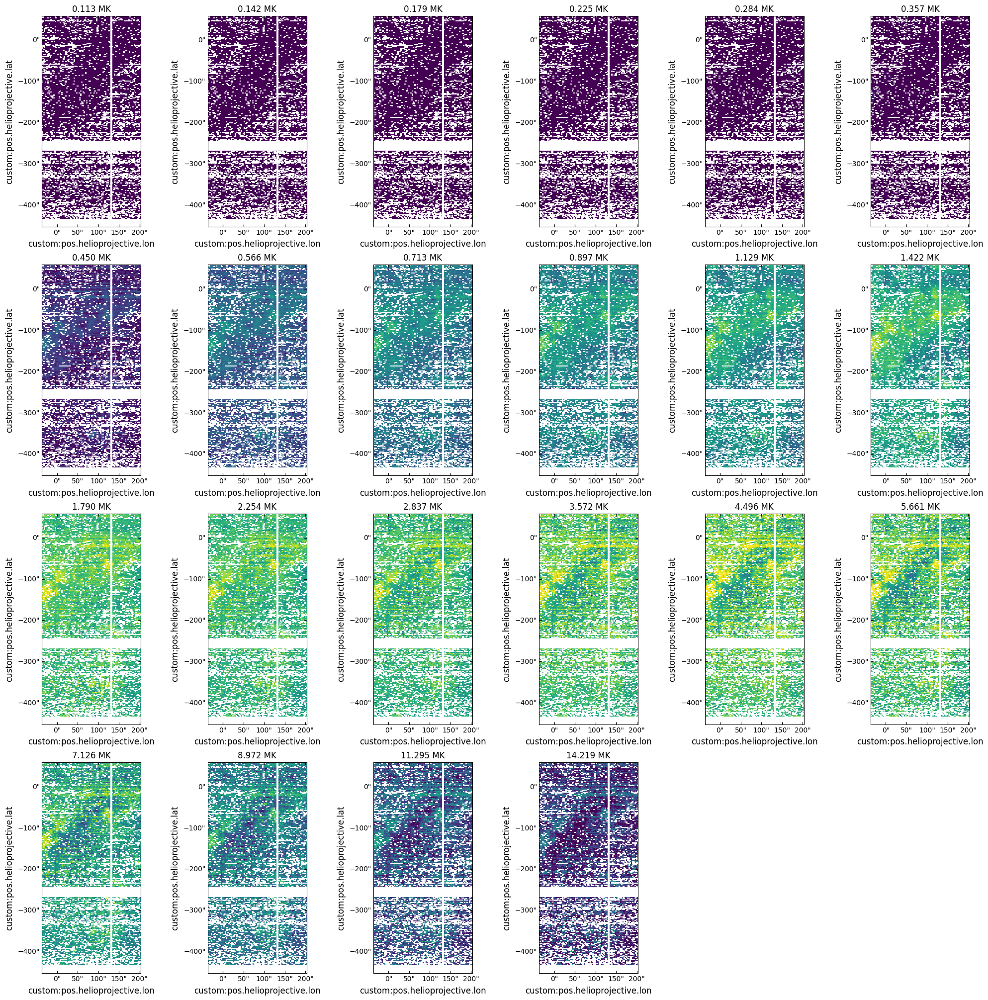

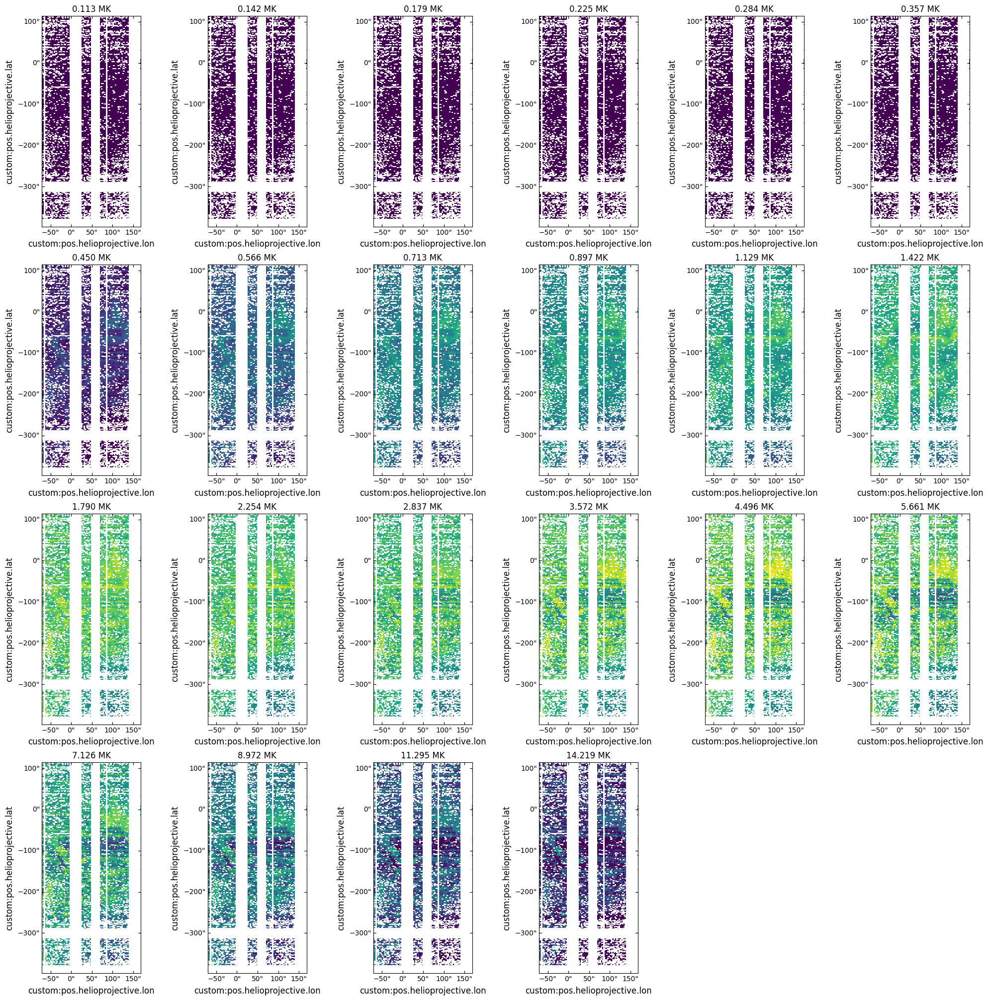

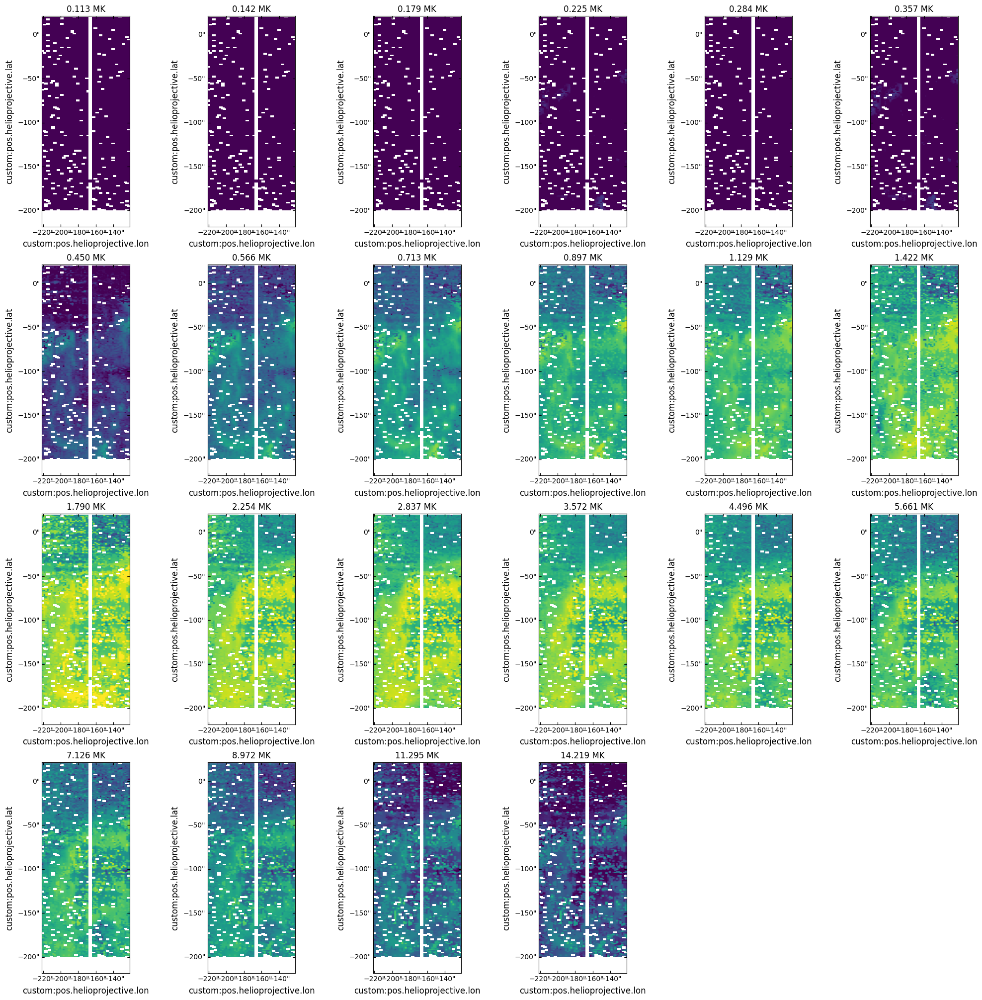

In [122]:
for row in ar_table:
    dem_inv = read_cube_with_xarray(f'../data/noaa_{row["NOAA AR"]}/diagnostics/dem/em_noaa{row["NOAA AR"]}_eis.nc',
                                    'temperature',
                                    'phys.temperature')
    fig = plt.figure(figsize=(20,20),layout='constrained')
    norm = ImageNormalize(vmin=1e24, vmax=1e27, stretch=LogStretch())
    for i in range(int(dem_inv.dimensions[0].value)):
        ax = fig.add_subplot(4,6,i+1,projection=dem_inv[i,...].wcs)
        dem_inv[i,...].plot(axes=ax,norm=norm)
        #ax.imshow(dem_res_11944['em'][i,...].data, norm=norm, origin='lower')
        ax.set_aspect(0.5)
        ax.set_title(f"{dem_inv.axis_world_coords(0)[0][i].to('MK'):.3f}")

In [121]:
dem_inv.axis_world_coords(0)

(<Quantity [  112946.27058971,   142190.93021276,   179007.7753715 ,
              225357.43732392,   283708.2045839 ,   357167.46828517,
              449647.20209038,   566072.28905373,   712642.78960223,
              897164.11736213,  1129462.70589707,  1421909.30212763,
             1790077.75371498,  2253574.3732392 ,  2837082.04583895,
             3571674.68285163,  4496472.02090379,  5660722.89053725,
             7126427.89602227,  8971641.17362126, 11294627.05897065,
            14219093.02127615] K>,)

## Pixel-averaged inversions

In [53]:
from astropy.visualization.wcsaxes import Quadrangle

def draw_quadrangle_ndcube(ax, blc, trc, **kwargs):
    width = trc.Tx - blc.Tx
    height = trc.Ty - blc.Ty
    r = Quadrangle(u.Quantity([blc.Tx, blc.Ty]), width, height,
                   transform=ax.get_transform('world'),
                   **kwargs)
    ax.add_patch(r)

In [54]:
box_corners = {
    11944: SkyCoord(Tx=[135,155]*u.arcsec,
                    Ty=[35,55]*u.arcsec,
                    frame=wcs_to_celestial_frame(collections[11944]['fe_12_195_119.2c'].wcs)),
    11967: SkyCoord(Tx=[-60,-40]*u.arcsec,
                    Ty=[-265,-245]*u.arcsec,
                    frame=wcs_to_celestial_frame(collections[11967]['fe_12_195_119.2c'].wcs)),
    11990: SkyCoord(Tx=[-205,-195]*u.arcsec,
                    Ty=[-160,-150]*u.arcsec,
                    frame=wcs_to_celestial_frame(collections[11990]['fe_12_195_119.2c'].wcs))
}


Save this figure

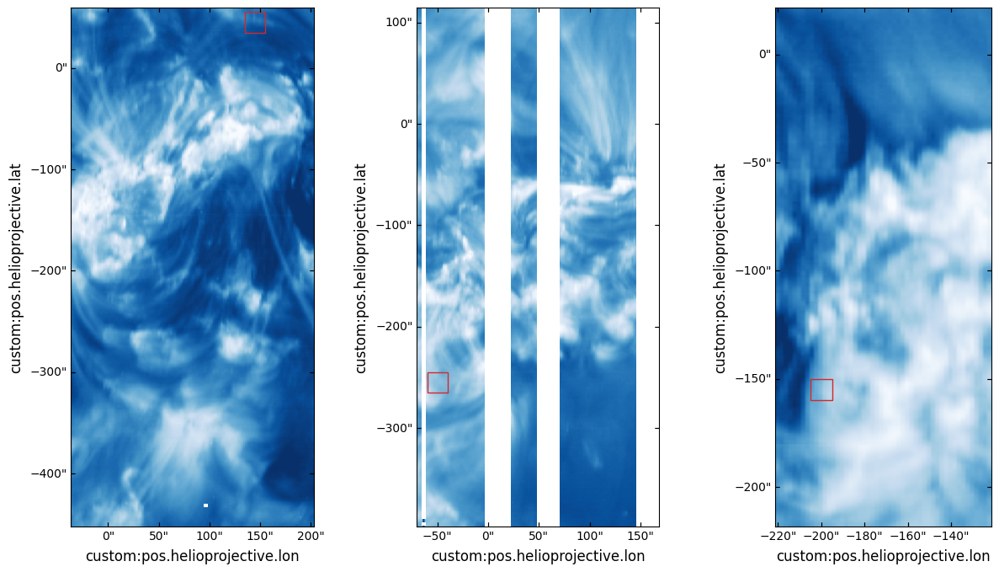

In [55]:
fig = plt.figure(figsize=(15,8))
for i,k in enumerate(collections):
    _cube = collections[k]['fe_12_195_119.2c']
    ax = fig.add_subplot(1,3,i+1,projection=_cube.wcs)
    vmin,vmax = AsymmetricPercentileInterval(1,99.9).get_limits(_cube.data)
    _cube.plot(axes=ax, aspect=0.5, cmap='Blues_r',
               norm=ImageNormalize(vmin=vmin, vmax=vmax, stretch=AsinhStretch()))
    
    draw_quadrangle_ndcube(ax, box_corners[k][0], box_corners[k][1], facecolor='none', edgecolor='C3')

Save this figure and add the pixel-averaged inverted DEM as well

(500000.0, 20000000.0)

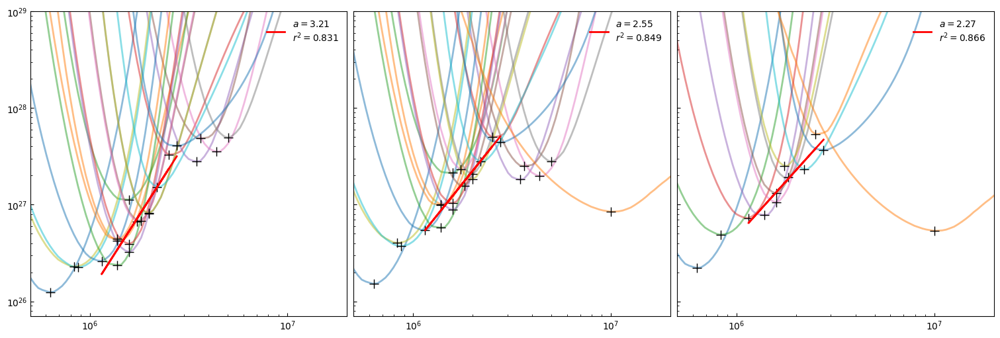

In [116]:
fig,axes = plt.subplots(1,3,figsize=(15,5),sharex=True,sharey=True, layout='constrained')
for i,row in enumerate(ar_table):
    # Build averaged intensities
    cropped_binned_collection = []
    for k in collections[row['NOAA AR']]:
        cropped_cube = collections[row['NOAA AR']][k].crop(box_corners[row['NOAA AR']][0],
                                                           box_corners[row['NOAA AR']][1])
        binned_cropped_cube = cropped_cube.rebin(
            cropped_cube.dimensions.value.astype(int),
            operation=np.mean,
            handle_mask=None,
            propagate_uncertainties=True,
        )
        cropped_binned_collection.append((k, binned_cropped_cube))
    cropped_binned_collection = ndcube.NDCollection(cropped_binned_collection, aligned_axes=(0,1))
    # Compute EM loci
    em_loci = [(v.data*v.unit).squeeze() / kernels[k] for k,v in cropped_binned_collection.items()]
    kernel_temperature = line_table['Temperature Contribution Function'][0]
    temperature_emd = kernel_temperature[[np.argmin(el) for el in em_loci]]
    emd = u.Quantity([el.min() for el  in em_loci])
    # Averaged inverted DEM
    dem_inv = read_cube_with_xarray(f'../data/noaa_{row["NOAA AR"]}/diagnostics/dem/em_noaa{row["NOAA AR"]}_eis.nc',
                                    'temperature',
                                    'phys.temperature')
    
    dem_inv_averaged = dem_inv.crop([box_corners[row["NOAA AR"]][0],None], [box_corners[row["NOAA AR"]][1],None])
    dem_inv_averaged = dem_inv_averaged.rebin((1,)+dem_inv_averaged.data.shape[1:])[:,0,0]
    # Plot
    for _em in em_loci:
        axes[i].plot(kernel_temperature, _em, alpha=0.5)
    axes[i].plot(temperature_emd, emd, marker='+', color='k', ls='', markersize=10)
    coef, xf, yf, r2 = log_log_linear_fit(
        temperature_emd.value,
        emd.value,
        1e6, 
        3e6,#min(temperature_emd[emd.argmax()].value,5e6),
    )
    axes[i].plot(10**xf, (10**coef[1])*((10**xf)**coef[0]), color='r', label=f'$a={coef[0]:.2f}$\n$r^2={r2:.3f}$')
    #axes[i].plot(dem_inv_averaged.axis_world_coords(0)[0], dem_inv_averaged.data)
    axes[i].legend(loc=1)
axes[0].set_yscale('log')
axes[0].set_xscale('log')
axes[0].set_ylim(7e25,1e29)
axes[0].set_xlim(5e5, 2e7)

Trying MCMC model, doesn't seem to work well...

In [63]:
mcmc_model = Model(cropped_binned_collection,#[245:255,50:60],
                   {k:v for k,v in kernels.items() if k in cropped_binned_collection},
                   10 ** np.arange(5.6,7, 0.1) * u.K,
                   kernel_temperatures=line_table['Temperature Contribution Function'][0],
                   model='mcmc')

In [64]:
res = mcmc_model._model(nwalkers=300, nsteps=1000)

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/demcmc/emission.py:228: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby("Groups").mean()["values"].values
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/demcmc/emission.py:228: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means = df.groupby("Groups").mean()["values"].values
/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/demcmc/emission.py:228: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of panda

/Users/wtbarnes/mambaforge/envs/loops-2024-talk/lib/python3.12/site-packages/astropy/units/quantity.py:671: RuntimeWarning: divide by zero encountered in divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


(500000.0, 20000000.0)

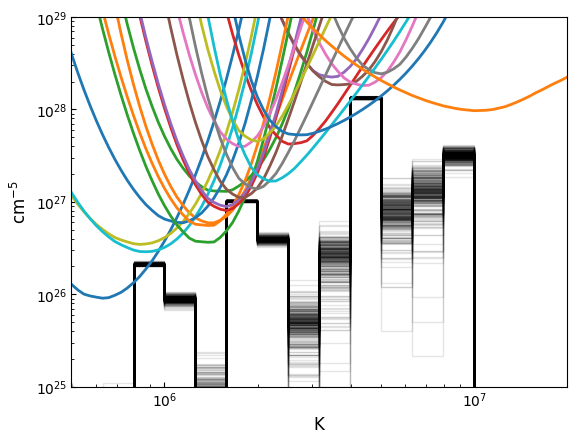

In [65]:
with quantity_support():
    fig = plt.figure()
    ax = fig.add_subplot()
    for sample in res.samples:
        ax.stairs(sample.value*u.Unit('cm-5 K-1')*res.temp_bins.bin_widths,
                  edges=res.temp_bins.edges,
                  color='k',
                  alpha=0.1)
    for k in cropped_binned_collection:
        em_loci = (cropped_binned_collection[k].data*cropped_binned_collection[k].unit) / kernels[k]
        ax.plot(mcmc_model.kernel_temperatures, em_loci.squeeze())
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_ylim(1e25,1e29)
ax.set_xlim(5e5, 2e7)

## Tmax Maps

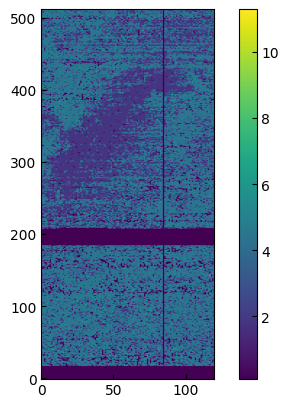

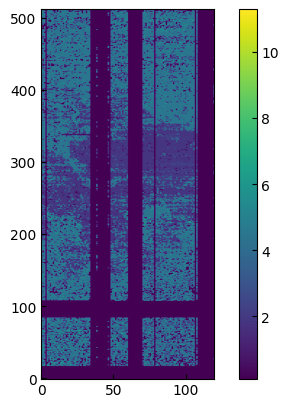

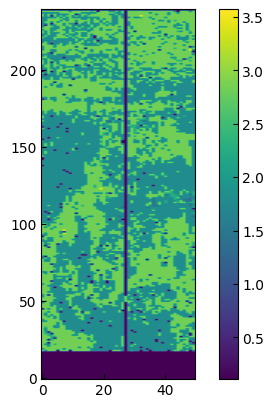

In [57]:
for i,row in enumerate(ar_table):
    em_dir = root_dir / f'noaa_{row["NOAA AR"]}' / 'diagnostics' / 'dem' 
    dem_res = read_cube_with_xarray(
        em_dir / f'em_noaa{row["NOAA AR"]}_eis.nc',
        'temperature',
        'phys.temperature',
    )
    temps = dem_res.axis_world_coords(0)[0]
    imax = np.argmax(dem_res.data,axis=0)
    tmax = temps[imax].to_value('MK')
    plt.imshow(tmax, origin='lower', aspect=0.5)
    plt.colorbar()
    plt.show()

## Compute Slope Maps

In [127]:
slope_fitting_params = {
    'temperature_bounds': (0.8*u.MK,3*u.MK),
    'em_threshold': 1e24*u.cm**(-5),
    'rsquared_tolerance': 0.5,
    'max_upper_bound': 8*u.MK,
    'mask_negative': True,
}

(0.0, 7.5)

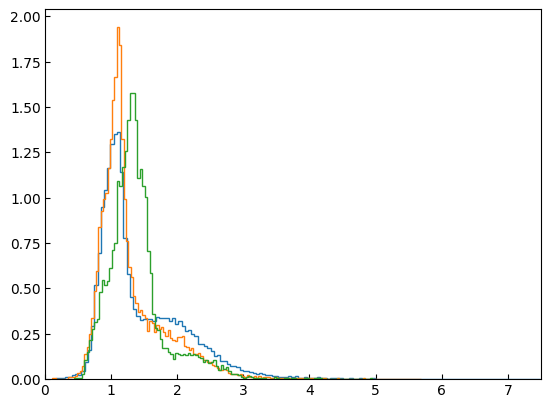

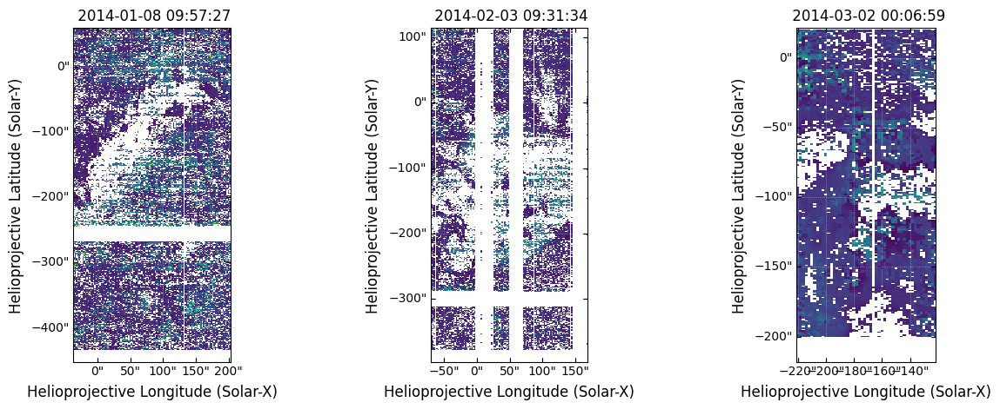

In [128]:
fig = plt.figure()
ax = fig.add_subplot()
fig2 = plt.figure(figsize=(15,5))
for i,row in enumerate(ar_table):
    em_dir = root_dir / f'noaa_{row["NOAA AR"]}' / 'diagnostics' / 'dem' 
    dem_res = read_cube_with_xarray(
        em_dir / f'em_noaa{row["NOAA AR"]}_eis.nc',
        'temperature',
        'phys.temperature',
    )
    slope_map = make_slope_map(dem_res, **slope_fitting_params)
    ax2 = fig2.add_subplot(1,3,i+1,projection=slope_map)
    slope_map.plot(axes=ax2,aspect=0.5,cmap='viridis',vmin=0.5, vmax=5.5)
    ax.hist(slope_map.data[~slope_map.mask], histtype='step', bins='fd', density=True);
    #with asdf.AsdfFile({'slope_map': slope_map}) as asdf_file:
    #    asdf_file.write_to(em_dir / f'emslope_noaa{row["NOAA AR"]}_eis.asdf')
ax.set_xlim(0,7.5)

(500000.0, 20000000.0)

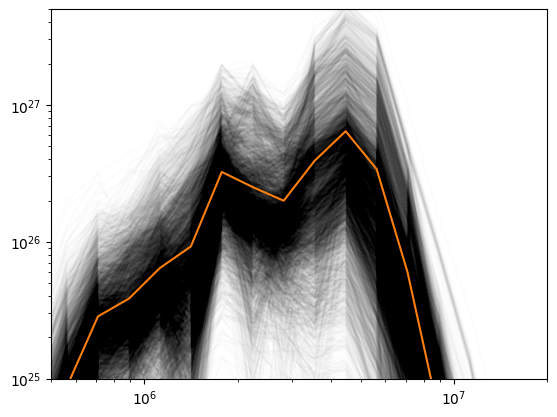

In [40]:
_sh = dem_res_11944.data.shape
for _em in dem_res_11944.data.reshape(_sh[:1]+(_sh[1]*_sh[2],)).T[::10]:
    plt.plot(dem_model.temperature_bin_centers,_em, color='k', alpha=0.01)
plt.plot(dem_model.temperature_bin_centers,em_1d.data, color='C1')
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e25, 5e27)
plt.xlim(.5e6,2e7)

## Scratch Work

In [26]:
from demregpy.dn2dem import dn2dem

In [31]:
dem_model

AttributeError: 'HK12Model' object has no attribute 'errors'

In [32]:
dem_model.kernel_matrix.shape

(21, 116)

In [33]:
dem_model.temperature_bin_edges.shape

(18,)

In [43]:
dn2dem(dem_model.data_matrix.T,
       dem_model.data_matrix.T*0.1,
       dem_model.kernel_matrix.T,
       np.log10(dem_model.kernel_temperatures.to_value('K')),
       dem_model.temperature_bin_centers.to_value('K'),
       dem_norm0=None,
       gloci=1,
       l_emd=0)

LinAlgError: Singular matrix

In [29]:
#delta_log_T = 0.02
#temperature = 10**np.arange(5.0, 7.3+delta_log_T, delta_log_T)*u.K
#density = 1e15*u.Unit('K cm-3') / temperature
#ca_17 = fiasco.Ion('Ca XVII', temperature)

In [30]:
selected_ions

{'Ca 14': CHIANTI Database Ion
 ---------------------
 Name: Ca 14
 Element: calcium (20)
 Charge: +13
 Number of Levels: 91
 Number of Transitions: 3747
 
 Temperature range: [0.100 MK, 19.953 MK]
 
 HDF5 Database: /Users/wtbarnes/Documents/projects/chianti/database/CHIANTI_v8.0.7/dbase.h5
 Using Datasets:
   ioneq: chianti
   abundance: sun_coronal_1992_feldman_ext
   ip: chianti,
 'Ca 15': CHIANTI Database Ion
 ---------------------
 Name: Ca 15
 Element: calcium (20)
 Charge: +14
 Number of Levels: 46
 Number of Transitions: 421
 
 Temperature range: [0.100 MK, 19.953 MK]
 
 HDF5 Database: /Users/wtbarnes/Documents/projects/chianti/database/CHIANTI_v8.0.7/dbase.h5
 Using Datasets:
   ioneq: chianti
   abundance: sun_coronal_1992_feldman_ext
   ip: chianti,
 'Ca 16': CHIANTI Database Ion
 ---------------------
 Name: Ca 16
 Element: calcium (20)
 Charge: +15
 Number of Levels: 204
 Number of Transitions: 5327
 
 Temperature range: [0.100 MK, 19.953 MK]
 
 HDF5 Database: /Users/wtbar

In [31]:
goft_ca17 = selected_ions['Ca 17'].contribution_function(1e9*u.cm**(-3))
goft_ca17_cp = selected_ions['Ca 17'].contribution_function(density,
                                                            couple_density_to_temperature=True)

In [32]:
transitions = selected_ions['Ca 17'].transitions.wavelength[~selected_ions['Ca 17'].transitions.is_twophoton]
i_sel = np.argmin(np.fabs(transitions - 192.858*u.AA))

In [ ]:
from astropy.visualization import 

(1000000.0, 50000000.0)

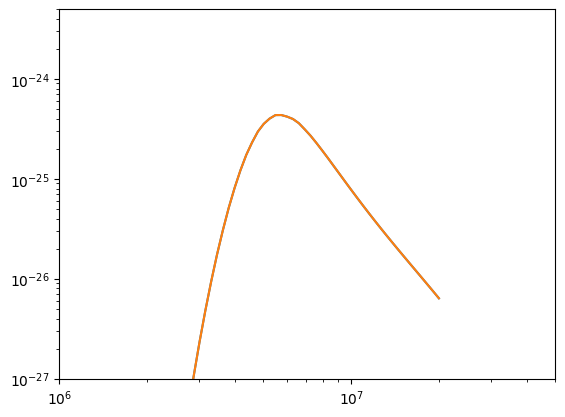

In [33]:
plt.plot(ca_17.temperature, goft_ca17[:,0,i_sel])
plt.plot(ca_17.temperature, goft_ca17_cp[:,0,i_sel])
plt.xscale('log')
plt.yscale('log')
plt.ylim(1e-27, 5e-24)
plt.xlim(1e6,5e7)

In [15]:
transitions.shape

(3252,)